In [453]:
import sys
import os
os.chdir('/home01/erotondo/misc_classes/ece590_fall2024')
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image
import time
from custom_datasets import ImageNet100 
import cv2
from copy import deepcopy

In [454]:
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

### SAM Mask Layover Function

In [455]:
def show_anns(anns,display="all",mask_num=0):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    if display == "all":
        for ann in sorted_anns:
            m = ann['segmentation']
            color_mask = np.concatenate([np.random.random(3), [0.35]])
            img[m] = color_mask
    elif display == "single_mask":
        ann = sorted_anns[mask_num]
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

# Load SAM Model ViT_L

In [456]:
def build_point_grid(n_per_side: int) -> np.ndarray:
    """Generates a 2D grid of points evenly spaced in [0,1]x[0,1]."""
    offset = 1 / (2 * n_per_side)
    points_one_side = np.linspace(offset, 1 - offset, n_per_side)
    points_one_side = points_one_side[1:points_one_side.shape[0]-1]
    points_x = np.tile(points_one_side[None, :], (n_per_side-2, 1))
    points_y = np.tile(points_one_side[:, None], (1, n_per_side-2))
    points = np.stack([points_x, points_y], axis=-1).reshape(-1, 2)
    return points


def build_all_layer_point_grids(
    n_per_side: int, n_layers: int, scale_per_layer: int
): #-> List[np.ndarray]:
    """Generates point grids for all crop layers."""
    points_by_layer = []
    for i in range(n_layers + 1):
        n_points = int(n_per_side / (scale_per_layer**i))
        points_by_layer.append(build_point_grid(n_points))
    return points_by_layer
# SETUP
points_per_side=8
pnt_grid = build_all_layer_point_grids(points_per_side,0,1)

In [457]:
sam_l = sam_model_registry["vit_l"](checkpoint="eli_dev/seg_any_model/models/vit_l/sam_vit_l_0b3195.pth")
sam_l.to(device="cuda")
mask_l_generator = SamAutomaticMaskGenerator(
    model=sam_l,
    points_per_side=None,
    pred_iou_thresh=0.95,
    stability_score_thresh=0.9,
    point_grids=pnt_grid,)

/home01/erotondo/anaconda3/lib/python3.12/site-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


# TESTING

In [458]:
imgNet100 = ImageNet100(pd.read_csv("datasets/imagenet100/train_set_meta.csv"))

In [459]:
def show_anns_black(anns,display="all",mask_num=0,sort_col="predicted_iou"):
    if len(anns) == 0:
        return
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((anns[0]['segmentation'].shape[0], anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    point = None
    if display == "all":
        for ann in anns:
            m = ann['segmentation']
            color_mask = np.concatenate([[0,0,0], [1]])
            img[m] = color_mask
    elif display == "single_mask":
        ann = anns[mask_num]
        m = ann['segmentation']
        color_mask = np.concatenate([[0,0,0], [1]])
        img[m] = color_mask
        ax.set_title(str(round(ann[sort_col],4)) + " (Area Prop.: " + str(round(ann["area"]/(224**2),4)) + ")",fontdict={"fontsize":15})
        print("Pred_IoU: " + str(ann["predicted_iou"]))
        print("Model Score: " + str(ann["stability_score"]))
        print("Metric Diff: " + str(round(abs(ann["predicted_iou"]-ann["stability_score"]),4)))
        point = ann["point_coords"][0]
    ax.imshow(img)
    ax.scatter(x=point[0],y=point[1],c="r")
    
def disp_helper(img,masks,i,blackout=False,sort_col="predicted_iou"):
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    if blackout:
        show_anns_black(masks,display="single_mask",mask_num=i,sort_col=sort_col)
    else:
        show_anns(masks,display="single_mask",mask_num=i,sort_col=sort_col)
    plt.axis('off')
    plt.show() 
    
def reg_display(img,masks):
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    show_anns(masks)
    plt.axis('off')
    plt.show() 

In [460]:
def stage_by_stage_eval(mask_generator,img,img_cls):
    img = img.numpy()
    img = img.transpose((1,2,0))
    img_resize = cv2.resize(img,(224,224))
    
    start_time = time.time()
    masks = mask_generator.generate(img_resize)
    print("Time to automask: " + str(round(time.time() - start_time,2)))
    print()
    print("Number of masks detected: " + str(len(masks)))
    print("Basic overlay of all masks:")
    reg_display(img_resize,masks)
    print()
    
    masks_unique = []
    for m in masks:
        flag = False
        for m_comp in masks:
            if m["stability_score"] == m_comp["stability_score"]:
                continue
            if (np.all(np.ma.mask_or(m["segmentation"], m_comp["segmentation"]) == m_comp["segmentation"])):
                flag = True
                break
        if flag:
            continue
        else:
            masks_unique.append(m)
    print("Number of distinct masks detected: " + str(len(masks_unique)))
    print("Overlay of distinct masks:")
    reg_display(img_resize,masks_unique)
    print()
    
    # masks_suff = []
    # for m in masks_unique:
    #     if m["area"]/(224**2) >= 0.01:
    #         masks_suff.append(m)
    # print("Number of distinct masks detected w/ area >= 1%: " + str(len(masks_suff)))
    # print("Overlay of suff_area distinct masks:")
    # reg_display(img_resize,masks_suff)
    # print()
        
    border_arr = np.zeros((224,224))
    border_arr[0,:] = 1
    border_arr[:,0] = 1
    border_arr[223,:] = 1
    border_arr[:,223] = 1
    min_border_masks = []
    for m in masks_unique:
        if np.sum(m["segmentation"] * border_arr) < 25: # Minimal border touching
            min_border_masks.append(m)
            
    if len(min_border_masks) == 0:
        for m in masks_unique:
            num_corners = 0
            cur_mask = m["segmentation"]
            # corner1
            if cur_mask[0,0] == True and cur_mask[0,1] == True and cur_mask[1,0] == True:
                num_corners+=1
            # corner2
            if cur_mask[0,223] == True and cur_mask[0,222] == True and cur_mask[1,223] == True:
                num_corners+=1
            # corner3
            if cur_mask[223,0] == True and cur_mask[222,0] == True and cur_mask[223,1] == True:
                num_corners+=1
            # corner4
            if cur_mask[223,223] == True and cur_mask[223,222] == True and cur_mask[222,223] == True:
                num_corners+=1
            if num_corners < 2:
                min_border_masks.append(m)
            
    print("Number of final candidate masks: " + str(len(min_border_masks)))
    print("Overlay of candidate masks:")
    reg_display(img_resize,min_border_masks)
    print()
    
    # Sort by area
    sorted_masks = sorted(min_border_masks, key=(lambda x: x["area"]), reverse=True)
    if len(sorted_masks) > 5:
        sorted_masks = sorted_masks[0:5]
    
    #print("Now displaying the five largest masks, sorted by SAM score:")
    for i in range(len(min_border_masks)):
        disp_helper(img_resize,min_border_masks,i,blackout=True,sort_col="area")

In [461]:
def final_mask(mask_generator,img,img_cls):
    img = img.numpy()
    img = img.transpose((1,2,0))
    img_resize = cv2.resize(img,(224,224))
    
    plt.figure(figsize=(5,5))
    plt.imshow(img_resize)
    plt.axis('off')
    plt.title(img_cls)
    plt.show() 
    
    start_time = time.time()
    masks = mask_generator.generate(img_resize)
    print("Time to automask: " + str(round(time.time() - start_time,2)))
    # print()
    # print("Number of masks detected: " + str(len(masks)))
    # print("Basic overlay of all masks:")
    # reg_display(img_resize,masks)
    # print()
    
    masks_unique = []
    for m in masks:
        flag = False
        for m_comp in masks:
            if m["stability_score"] == m_comp["stability_score"]:
                continue
            if (np.all(np.ma.mask_or(m["segmentation"], m_comp["segmentation"]) == m_comp["segmentation"])):
                flag = True
                break
        if flag:
            continue
        else:
            masks_unique.append(m)
    # print("Number of distinct masks detected: " + str(len(masks_unique)))
    # print("Overlay of distinct masks:")
    # reg_display(img_resize,masks_unique)
    # print()
    
    # masks_suff = []
    # for m in masks_unique:
    #     if m["area"]/(224**2) >= 0.01:
    #         masks_suff.append(m)
    # print("Number of distinct masks detected w/ area >= 1%: " + str(len(masks_suff)))
    # print("Overlay of suff_area distinct masks:")
    # reg_display(img_resize,masks_suff)
    # print()
        
    border_arr = np.zeros((224,224))
    border_arr[0,:] = 1
    border_arr[:,0] = 1
    border_arr[223,:] = 1
    border_arr[:,223] = 1
    min_border_masks = []
    for m in masks_unique:
        if np.sum(m["segmentation"] * border_arr) < 25: # Minimal border touching
            min_border_masks.append(m)
            
    if len(min_border_masks) == 0:
        for m in masks_unique:
            num_corners = 0
            cur_mask = m["segmentation"]
            # corner1
            if cur_mask[0,0] == True and cur_mask[0,1] == True and cur_mask[1,0] == True:
                num_corners+=1
            # corner2
            if cur_mask[0,223] == True and cur_mask[0,222] == True and cur_mask[1,223] == True:
                num_corners+=1
            # corner3
            if cur_mask[223,0] == True and cur_mask[222,0] == True and cur_mask[223,1] == True:
                num_corners+=1
            # corner4
            if cur_mask[223,223] == True and cur_mask[223,222] == True and cur_mask[222,223] == True:
                num_corners+=1
            if num_corners < 2:
                min_border_masks.append(m)
                
    # Sort by area
    sorted_masks = sorted(min_border_masks, key=(lambda x: x["area"]), reverse=True)
    # if len(sorted_masks) > 5:
    #     sorted_masks = sorted_masks[0:5]
            
    # print("Number of final candidate masks: " + str(len(min_border_masks)))
    # print("Overlay of candidate masks:")
    # reg_display(img_resize,min_border_masks)
    # print()
    
    #print("Now displaying the five largest masks, sorted by SAM score:")
    # for i in range(len(min_border_masks)):
    #     disp_helper(img_resize,min_border_masks,i,blackout=True,sort_col="stability_score")
    disp_helper(img_resize,sorted_masks,0,blackout=True,sort_col="area")

In [130]:
cur_img, cur_img_cls = imgNet100.__getitem__(0)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

NameError: name 'final_mask' is not defined

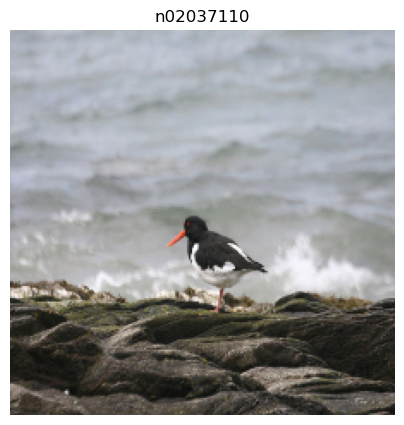

Time to automask: 0.44
Pred_IoU: 0.9917184114456177
Model Score: 0.9787798523902893
Metric Diff: 0.0129


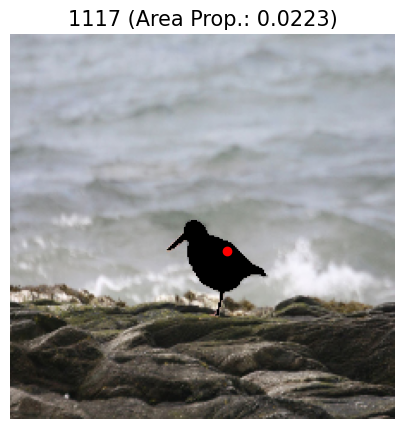

In [463]:
cur_img, cur_img_cls = imgNet100.__getitem__(1)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

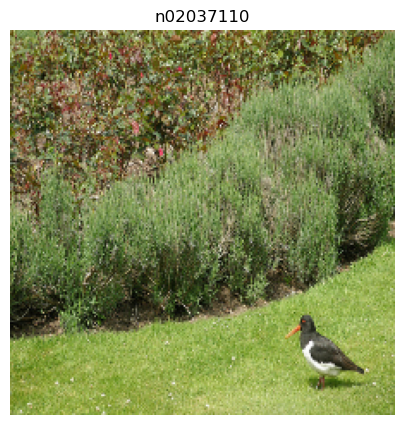

Time to automask: 0.43
Pred_IoU: 0.9971573948860168
Model Score: 0.9788199663162231
Metric Diff: 0.0183


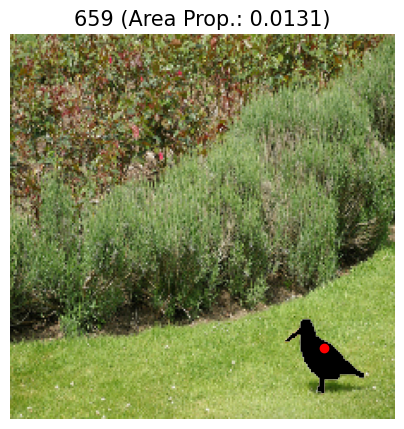

In [464]:
cur_img, cur_img_cls = imgNet100.__getitem__(2)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

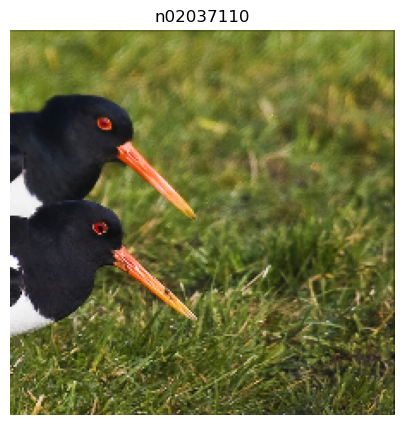

Time to automask: 0.44
Pred_IoU: 0.9788957238197327
Model Score: 0.9637338519096375
Metric Diff: 0.0152


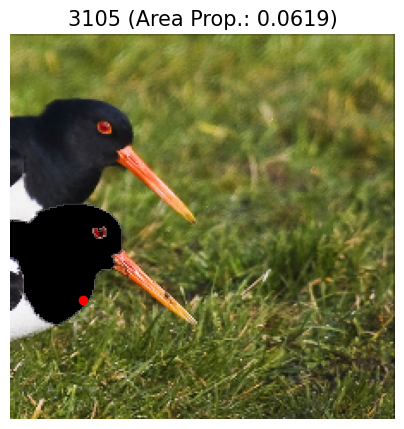

In [465]:
cur_img, cur_img_cls = imgNet100.__getitem__(1000)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

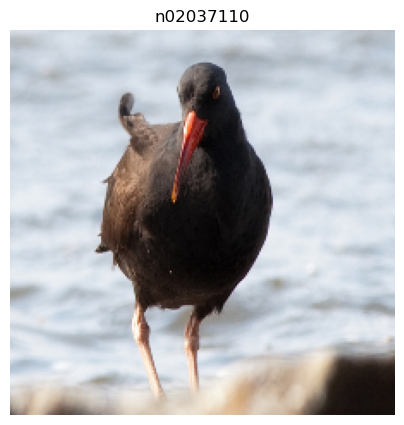

Time to automask: 0.44
Pred_IoU: 1.0161041021347046
Model Score: 0.9883308410644531
Metric Diff: 0.0278


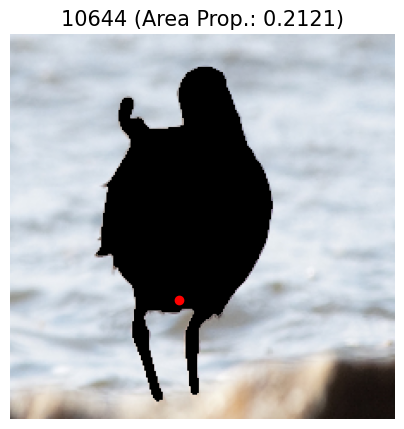

In [466]:
cur_img, cur_img_cls = imgNet100.__getitem__(400)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

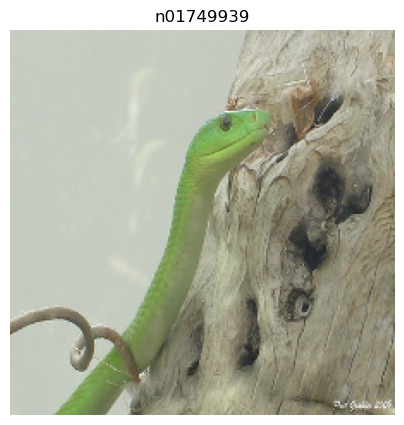

Time to automask: 0.43
Pred_IoU: 0.9688066840171814
Model Score: 0.9641615152359009
Metric Diff: 0.0046


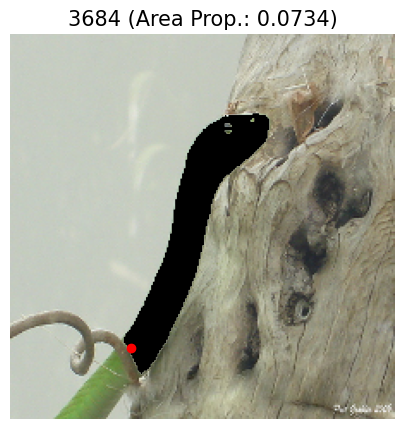

In [467]:
cur_img, cur_img_cls = imgNet100.__getitem__(7827)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

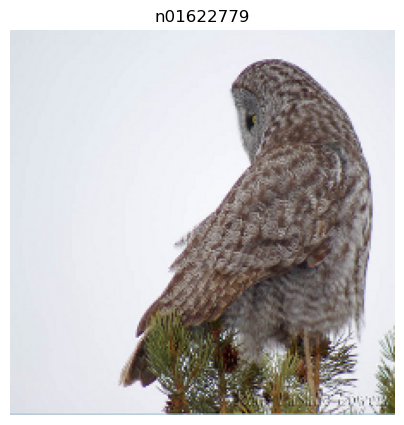

Time to automask: 0.44
Pred_IoU: 0.990668535232544
Model Score: 0.9395325183868408
Metric Diff: 0.0511


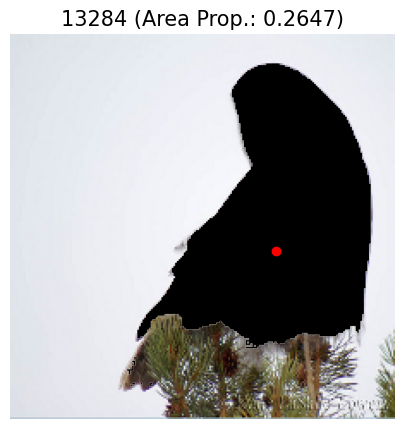

In [468]:
cur_img, cur_img_cls = imgNet100.__getitem__(72430)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

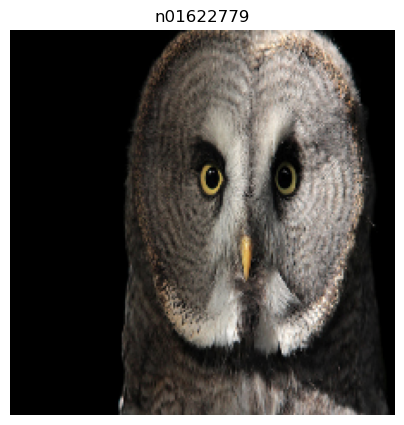

Time to automask: 0.44
Pred_IoU: 1.0345522165298462
Model Score: 0.9919365048408508
Metric Diff: 0.0426


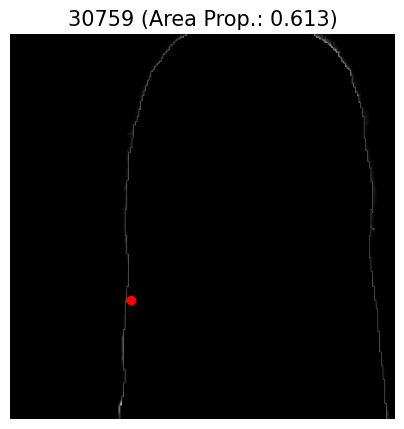

In [469]:
cur_img, cur_img_cls = imgNet100.__getitem__(72435)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

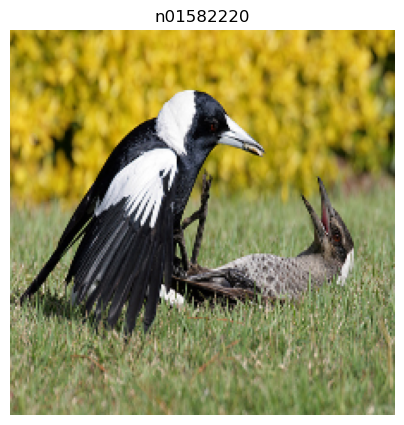

Time to automask: 0.44
Pred_IoU: 0.9947292804718018
Model Score: 0.967275083065033
Metric Diff: 0.0275


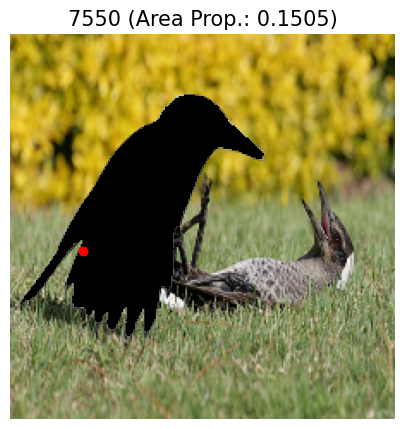

In [470]:
cur_img, cur_img_cls = imgNet100.__getitem__(72830)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

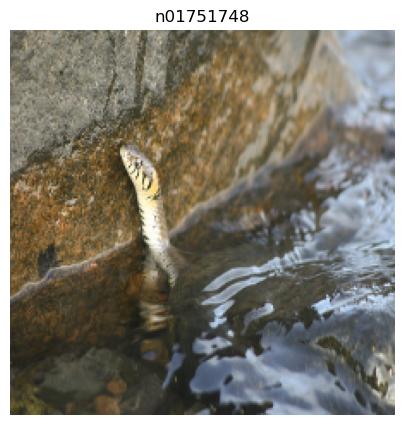

Time to automask: 0.43
Pred_IoU: 0.9621196985244751
Model Score: 0.9599618911743164
Metric Diff: 0.0022


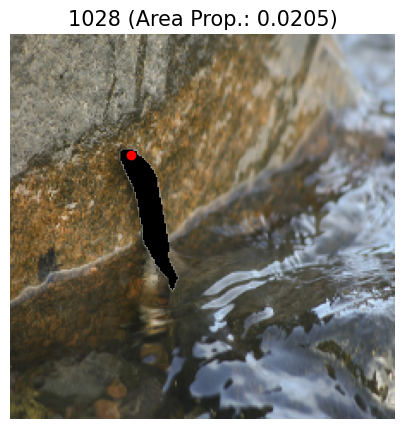

In [471]:
cur_img, cur_img_cls = imgNet100.__getitem__(90000)
#stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)
final_mask(mask_l_generator,cur_img, cur_img_cls)

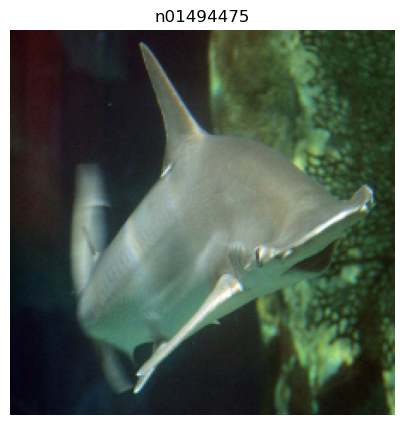

Time to automask: 0.44
Pred_IoU: 1.006995439529419
Model Score: 0.9329063892364502
Metric Diff: 0.0741


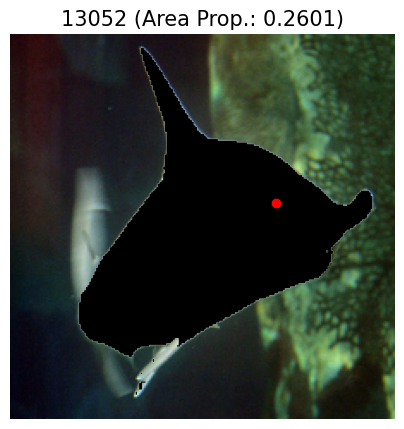

In [472]:
cur_img, cur_img_cls = imgNet100.__getitem__(7490)
final_mask(mask_l_generator,cur_img,cur_img_cls)

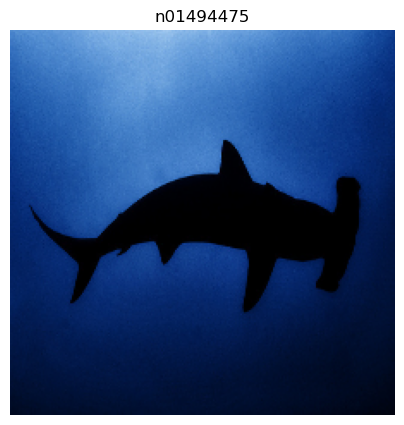

Time to automask: 0.44
Pred_IoU: 1.0101709365844727
Model Score: 0.9841316342353821
Metric Diff: 0.026


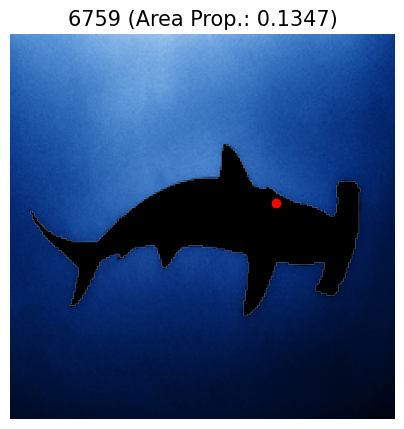

In [473]:
cur_img, cur_img_cls = imgNet100.__getitem__(7492)
final_mask(mask_l_generator,cur_img,cur_img_cls)

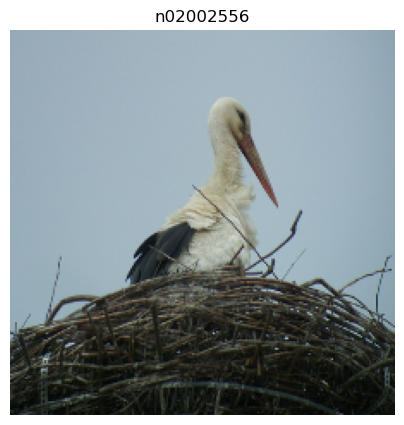

Time to automask: 0.44
Pred_IoU: 0.9860541820526123
Model Score: 0.9554091691970825
Metric Diff: 0.0306


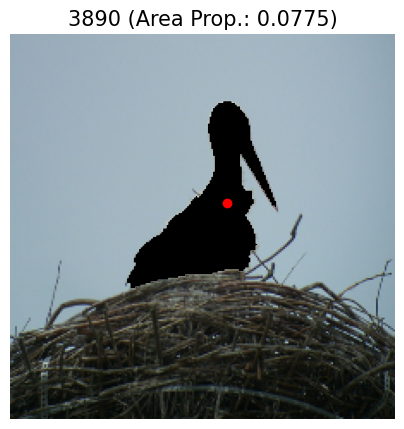

In [474]:
cur_img, cur_img_cls = imgNet100.__getitem__(74930)
final_mask(mask_l_generator,cur_img,cur_img_cls)

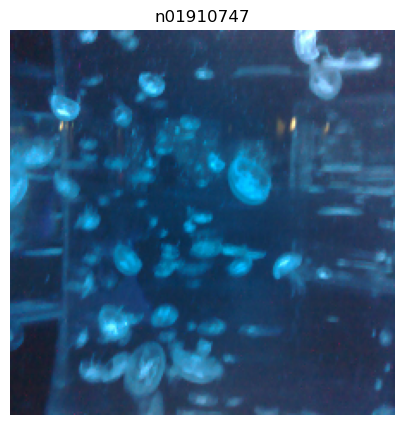

Time to automask: 0.43
Pred_IoU: 0.9538723230361938
Model Score: 0.9635416865348816
Metric Diff: 0.0097


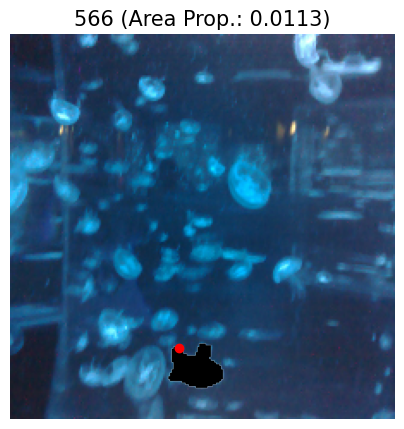

In [475]:
cur_img, cur_img_cls = imgNet100.__getitem__(100000)
final_mask(mask_l_generator,cur_img,cur_img_cls)

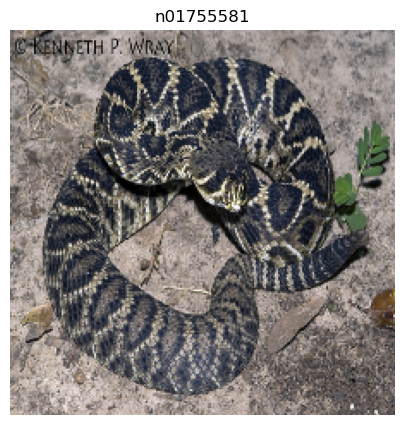

Time to automask: 0.43
Pred_IoU: 0.9814147353172302
Model Score: 0.949367105960846
Metric Diff: 0.032


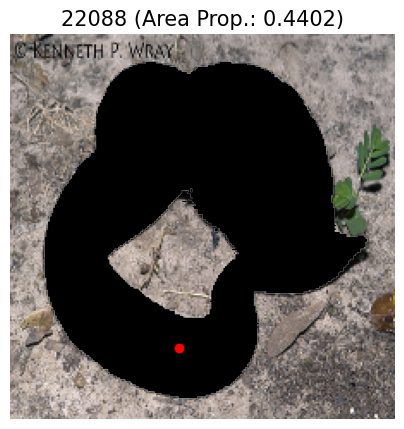

In [476]:
cur_img, cur_img_cls = imgNet100.__getitem__(120000)
final_mask(mask_l_generator,cur_img,cur_img_cls)

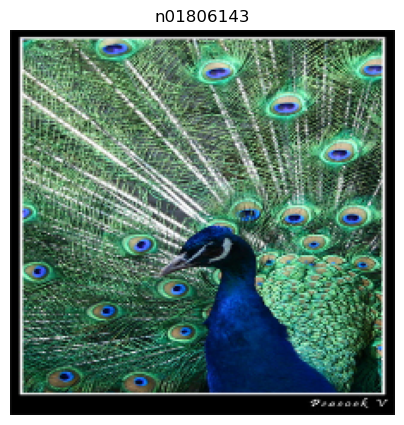

Time to automask: 0.44
Pred_IoU: 1.023109793663025
Model Score: 0.9589563012123108
Metric Diff: 0.0642


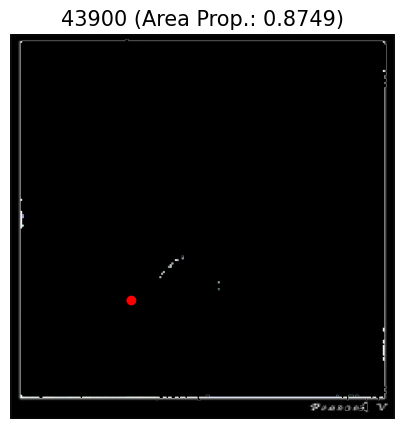

In [477]:
cur_img, cur_img_cls = imgNet100.__getitem__(125000)
final_mask(mask_l_generator,cur_img,cur_img_cls)

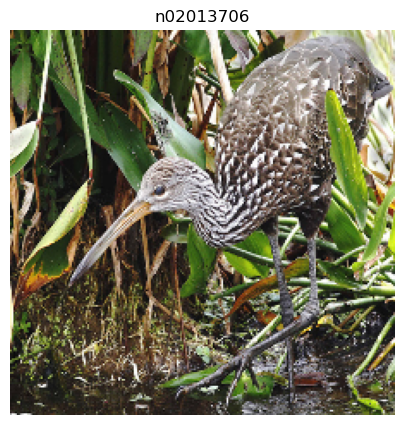

Time to automask: 0.43
Pred_IoU: 0.9932762384414673
Model Score: 0.9268959760665894
Metric Diff: 0.0664


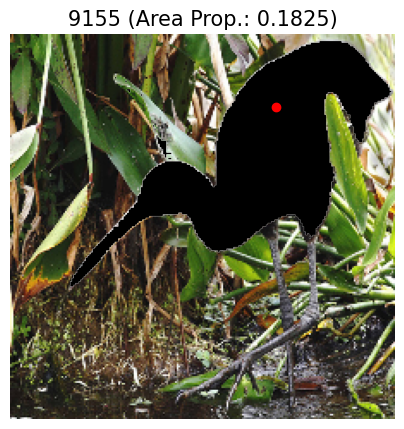

In [478]:
cur_img, cur_img_cls = imgNet100.__getitem__(80000)
final_mask(mask_l_generator,cur_img,cur_img_cls)

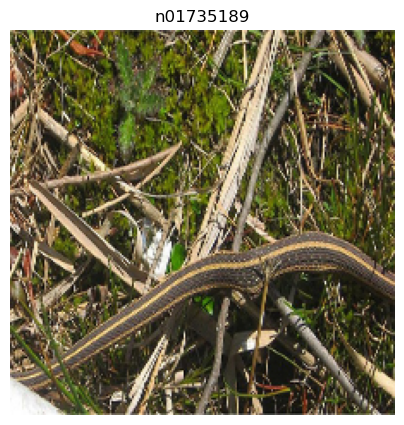

Time to automask: 0.43
Pred_IoU: 0.9802067279815674
Model Score: 0.9589002132415771
Metric Diff: 0.0213


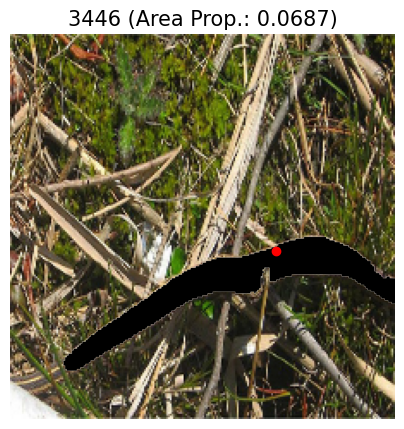

In [479]:
cur_img, cur_img_cls = imgNet100.__getitem__(60000)
final_mask(mask_l_generator,cur_img,cur_img_cls)

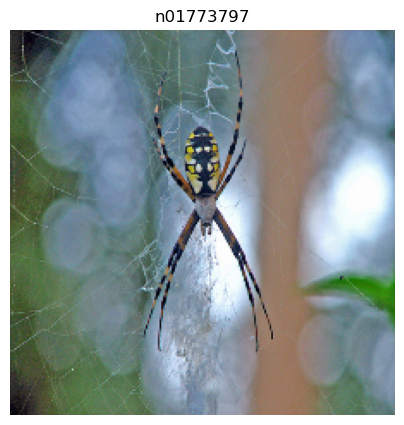

Time to automask: 0.43
Pred_IoU: 0.9509278535842896
Model Score: 0.9010183215141296
Metric Diff: 0.0499


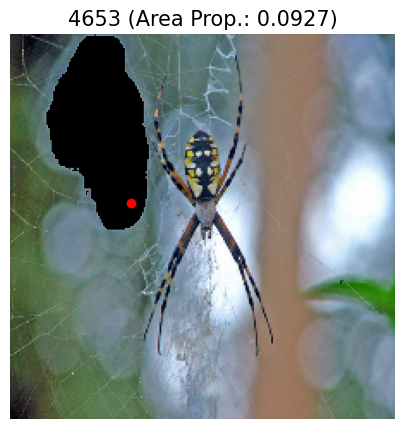

In [480]:
cur_img, cur_img_cls = imgNet100.__getitem__(50000)
final_mask(mask_l_generator,cur_img,cur_img_cls)

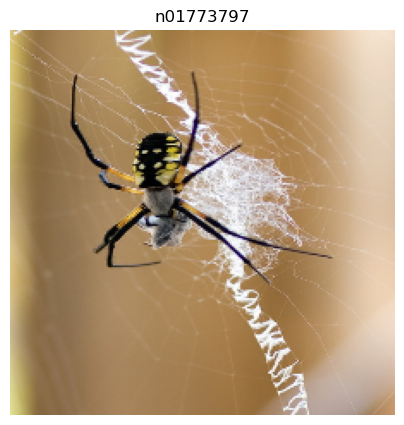

Time to automask: 0.43
Pred_IoU: 0.9921026229858398
Model Score: 0.984375
Metric Diff: 0.0077


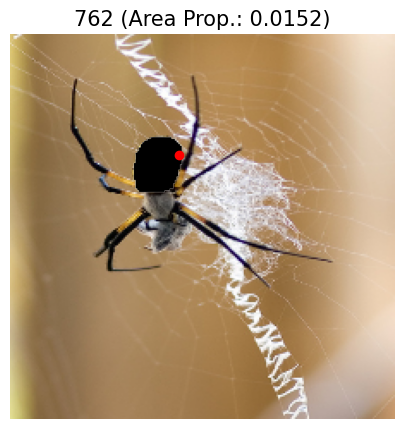

In [481]:
cur_img, cur_img_cls = imgNet100.__getitem__(50001)
final_mask(mask_l_generator,cur_img,cur_img_cls)

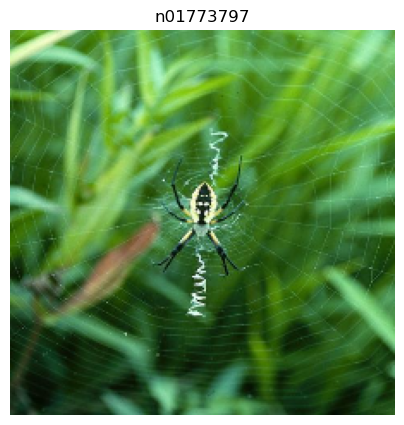

Time to automask: 0.43
Pred_IoU: 0.9683137536048889
Model Score: 0.973089337348938
Metric Diff: 0.0048


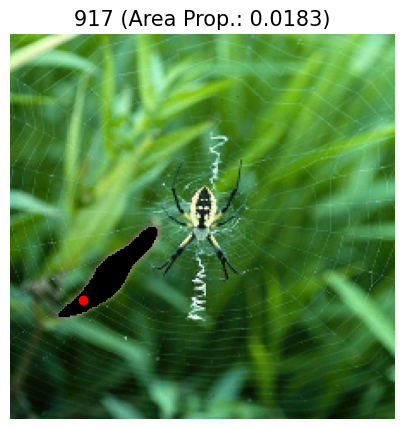

In [482]:
cur_img, cur_img_cls = imgNet100.__getitem__(50002)
final_mask(mask_l_generator,cur_img,cur_img_cls)

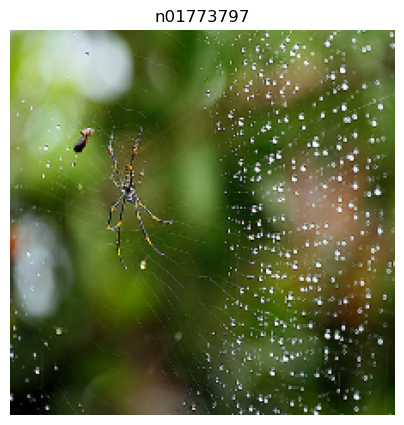

Time to automask: 0.43
Pred_IoU: 0.9610159397125244
Model Score: 0.9863013625144958
Metric Diff: 0.0253


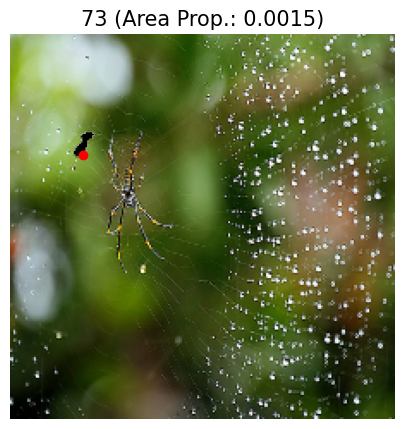

In [483]:
cur_img, cur_img_cls = imgNet100.__getitem__(50005)
final_mask(mask_l_generator,cur_img,cur_img_cls)

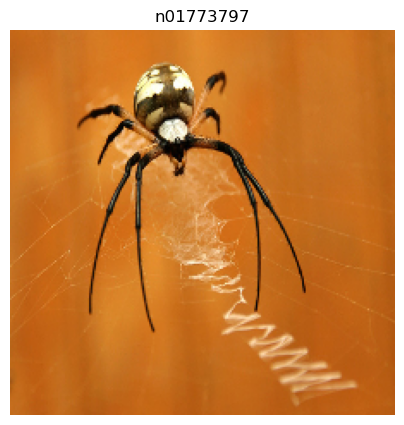

Time to automask: 0.44
Pred_IoU: 1.0003056526184082
Model Score: 0.9848726391792297
Metric Diff: 0.0154


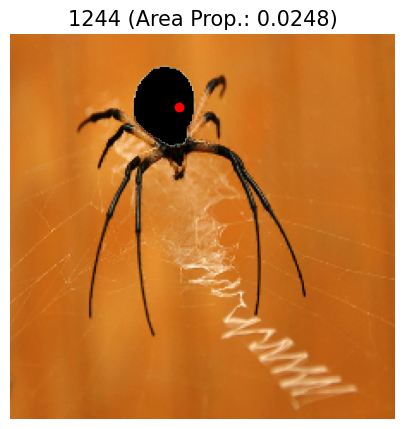

In [484]:
cur_img, cur_img_cls = imgNet100.__getitem__(50100)
final_mask(mask_l_generator,cur_img,cur_img_cls)

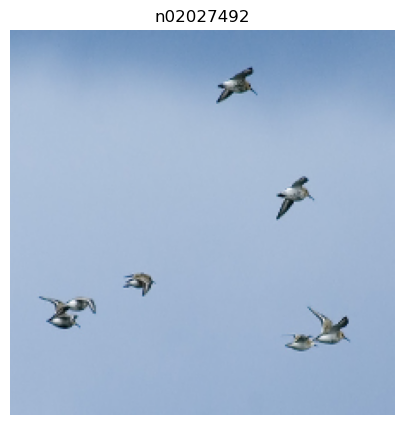

Time to automask: 0.44
Pred_IoU: 0.9575073719024658
Model Score: 0.9454023241996765
Metric Diff: 0.0121


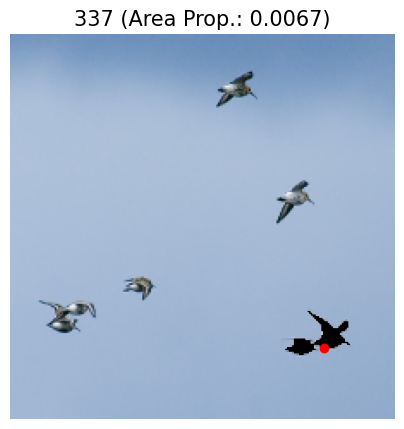

In [485]:
cur_img, cur_img_cls = imgNet100.__getitem__(53000)
final_mask(mask_l_generator,cur_img,cur_img_cls)

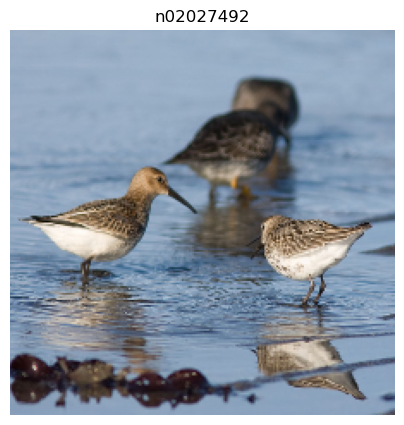

Time to automask: 0.44
Pred_IoU: 1.007771611213684
Model Score: 0.9739970564842224
Metric Diff: 0.0338


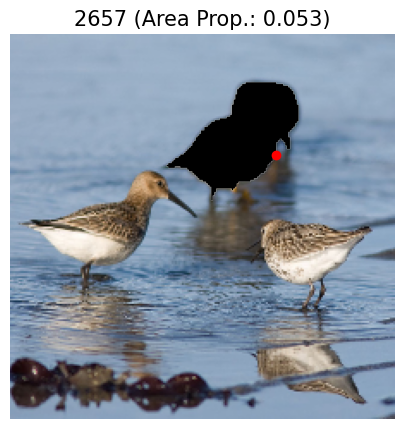

In [486]:
cur_img, cur_img_cls = imgNet100.__getitem__(53001)
final_mask(mask_l_generator,cur_img,cur_img_cls)

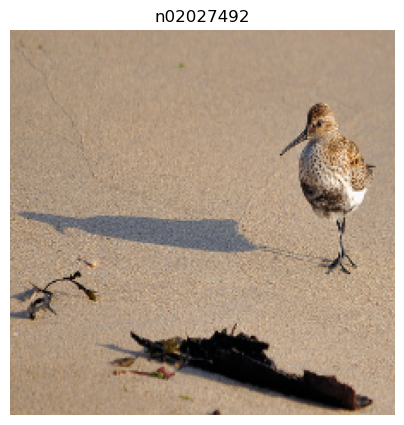

Time to automask: 0.45
Pred_IoU: 0.9778310060501099
Model Score: 0.9391858577728271
Metric Diff: 0.0386


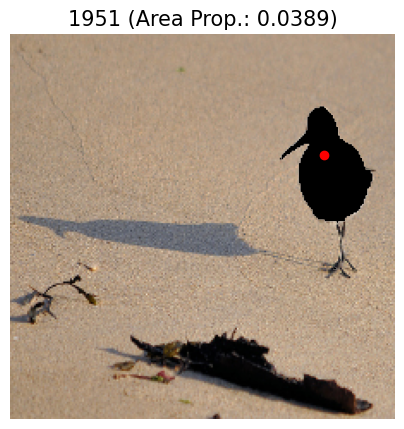

In [487]:
cur_img, cur_img_cls = imgNet100.__getitem__(53002)
final_mask(mask_l_generator,cur_img,cur_img_cls)

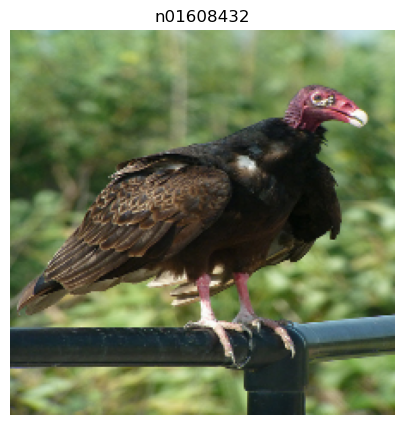

Time to automask: 0.5
Pred_IoU: 0.9915580749511719
Model Score: 0.906138002872467
Metric Diff: 0.0854


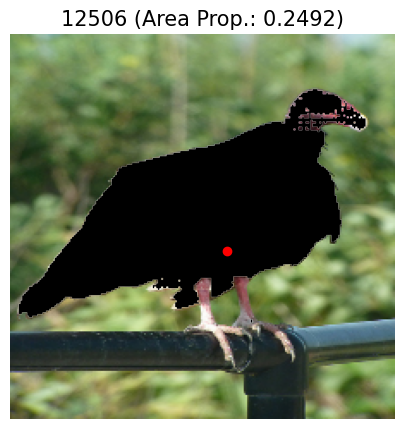

In [493]:
cur_img, cur_img_cls = imgNet100.__getitem__(53502)
final_mask(mask_l_generator,cur_img,cur_img_cls)

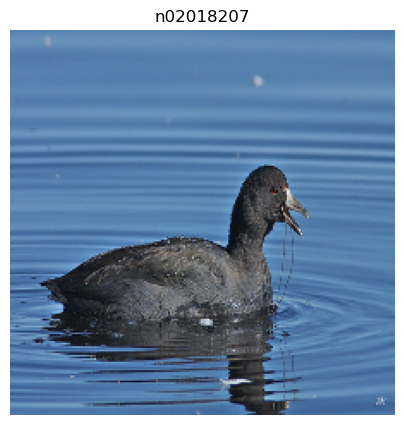

Time to automask: 0.46
Pred_IoU: 0.9995663166046143
Model Score: 0.95632004737854
Metric Diff: 0.0432


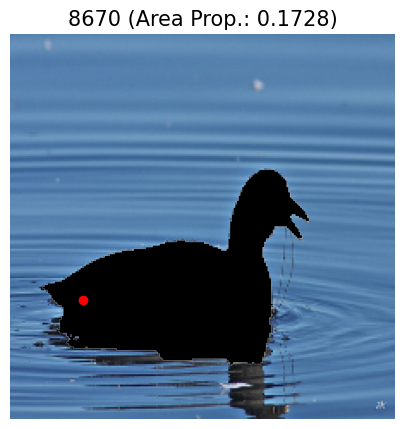

In [494]:
cur_img, cur_img_cls = imgNet100.__getitem__(56002)
final_mask(mask_l_generator,cur_img,cur_img_cls)

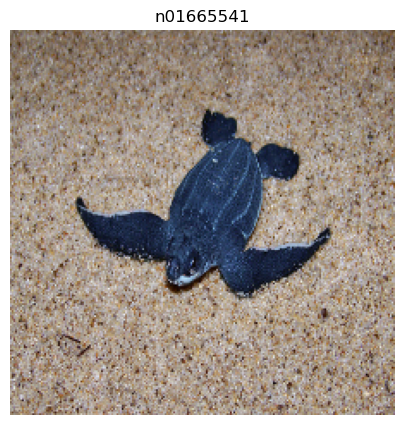

Time to automask: 0.47
Pred_IoU: 1.0112128257751465
Model Score: 0.9770278930664062
Metric Diff: 0.0342


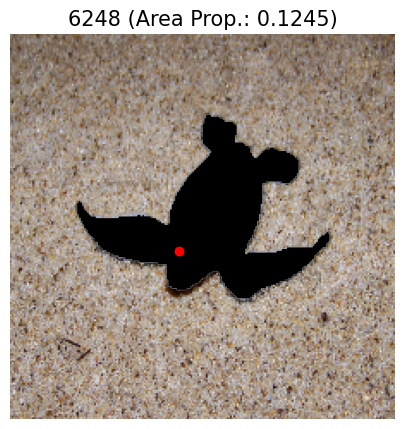

In [495]:
cur_img, cur_img_cls = imgNet100.__getitem__(13002)
final_mask(mask_l_generator,cur_img,cur_img_cls)

In [496]:
# stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)